In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import datasets
from scipy import stats
from scipy.stats import skew, kurtosis
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

In [ ]:
df = pd.read_csv('/content/corporate_stress_dataset.csv',index_col=0)
df

,Age,Gender,Marital_Status,Job_Role,Experience_Years,Monthly_Salary_INR,Working_Hours_per_Week,Commute_Time_Hours,Remote_Work,Stress_Level,...,Work_Life_Balance,Family_Support_Level,Job_Satisfaction,Performance_Rating,Team_Size,Training_Opportunities,Gender_Bias_Experienced,Discrimination_Experienced,Burnout_Symptoms,Location
ID,,,,,,,,,,,,,,,,,,,,,
1,56,Non-Binary,Widowed,Developer,5,102703.08,44,1.72,True,0,...,9,2,5,10,38,False,True,True,No,Tier-3
2,46,Female,Single,Analyst,20,165583.91,54,0.62,True,7,...,9,1,10,9,72,True,True,True,No,Tier-3
3,32,Female,Single,Developer,10,38005.39,81,1.22,False,7,...,6,1,1,1,67,False,False,False,Yes,Metro
4,60,Female,Divorced,Analyst,26,51127.36,79,2.03,False,6,...,8,10,5,10,98,True,True,False,Yes,Metro
5,25,Male,Married,Sales,29,174597.45,63,1.45,True,8,...,3,1,9,2,85,True,False,False,No,Tier-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49996,43,Female,Widowed,HR,8,34594.10,58,1.66,False,0,...,4,8,7,3,69,True,True,False,No,Tier-3
49997,45,Male,Single,Analyst,31,117925.92,42,1.58,False,1,...,10,3,0,4,60,True,True,True,Occasional,Tier-2
49998,43,Female,Divorced,Manager,7,109814.51,49,1.49,True,6,...,0,0,10,6,56,False,True,False,No,Metro



Matriz de Correlação:
                                        ID       Age Experience_Years  \
ID                                     1.0  0.002167         0.000046   
Age                               0.002167       1.0         0.003991   
Experience_Years                  0.000046  0.003991              1.0   
Monthly_Salary_INR                -0.00532 -0.005311        -0.006629   
Working_Hours_per_Week            -0.00622 -0.005989        -0.006861   
Commute_Time_Hours               -0.003895  0.002419         0.002269   
Stress_Level                      0.001127  0.001107        -0.003976   
Sleep_Hours                       0.006601  0.003441          0.00724   
Physical_Activity_Hours_per_Week  0.004252  0.001706        -0.007258   
Manager_Support_Level             0.003603 -0.002724        -0.001685   
Work_Pressure_Level              -0.001599 -0.006942        -0.000614   
Annual_Leaves_Taken               0.005862   0.00049        -0.002361   
Work_Life_Balance           

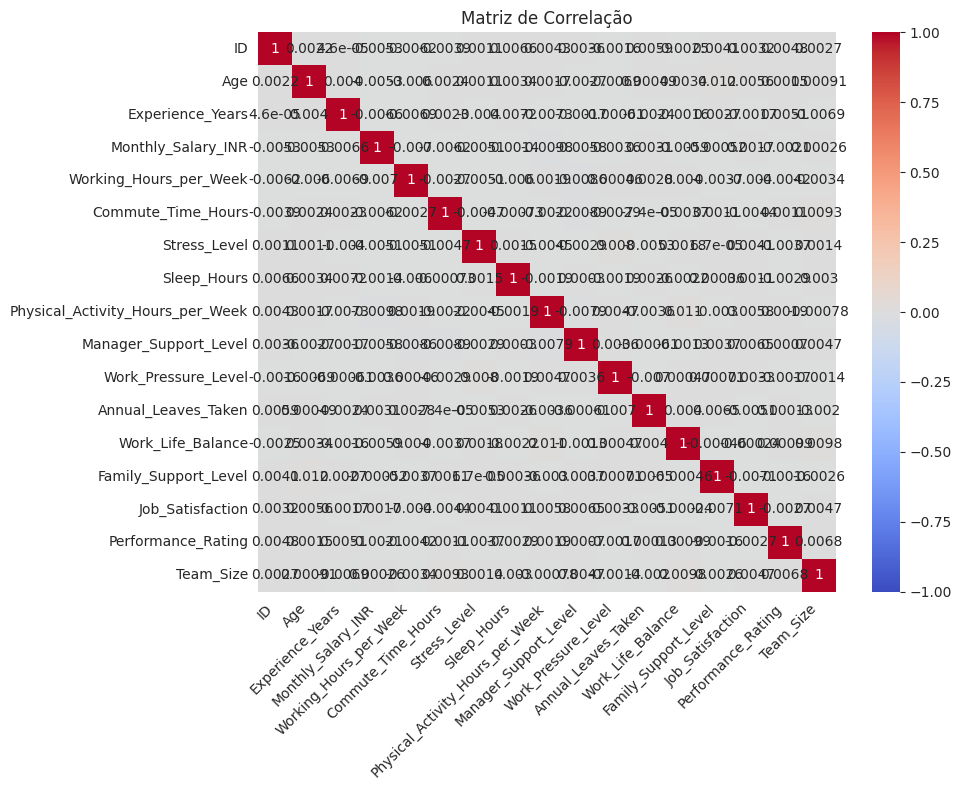

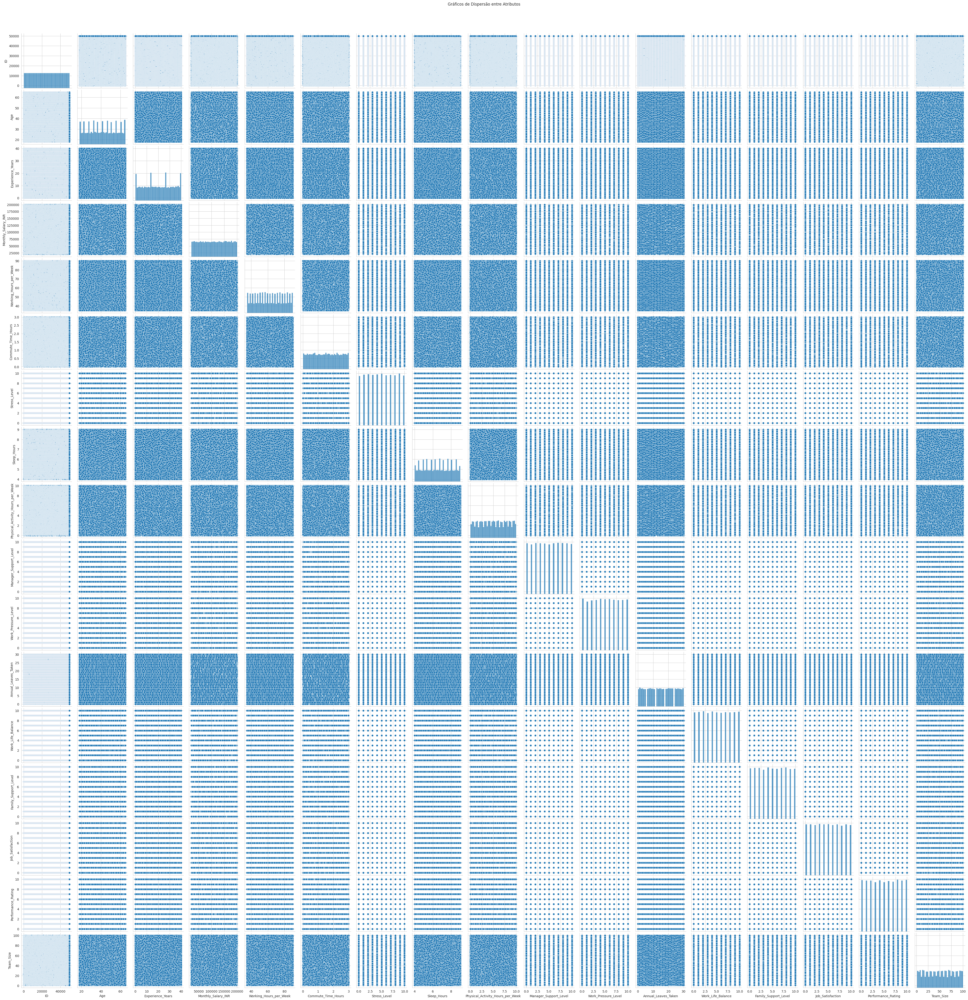

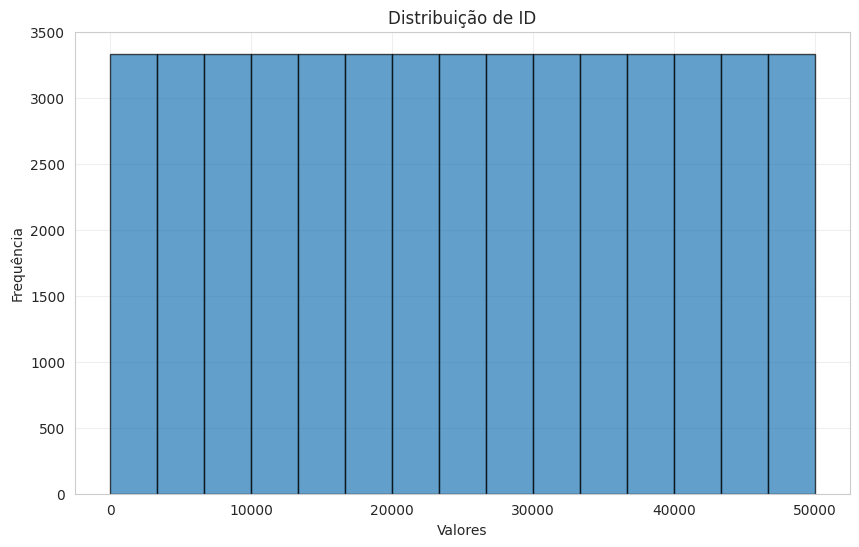

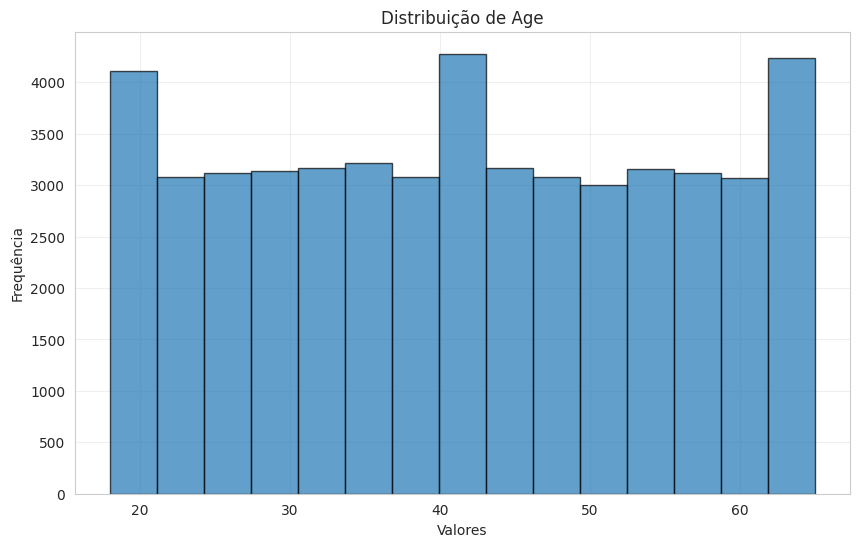

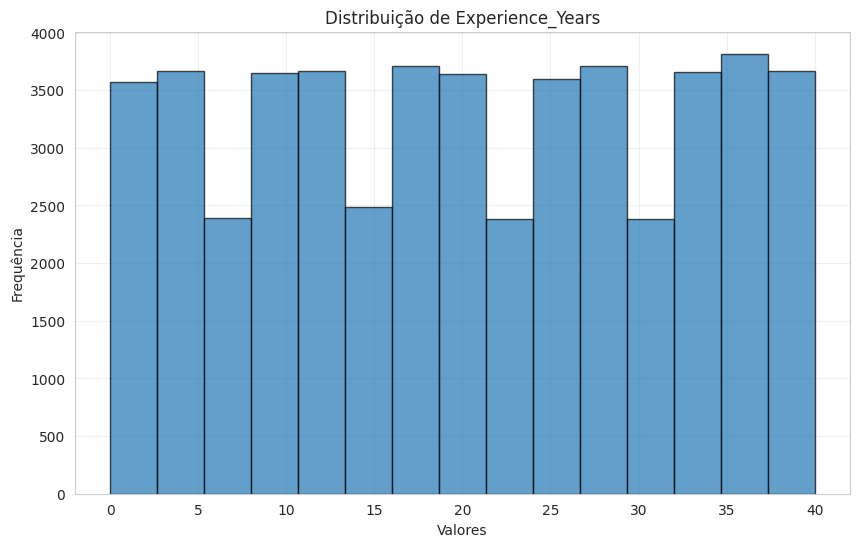

...

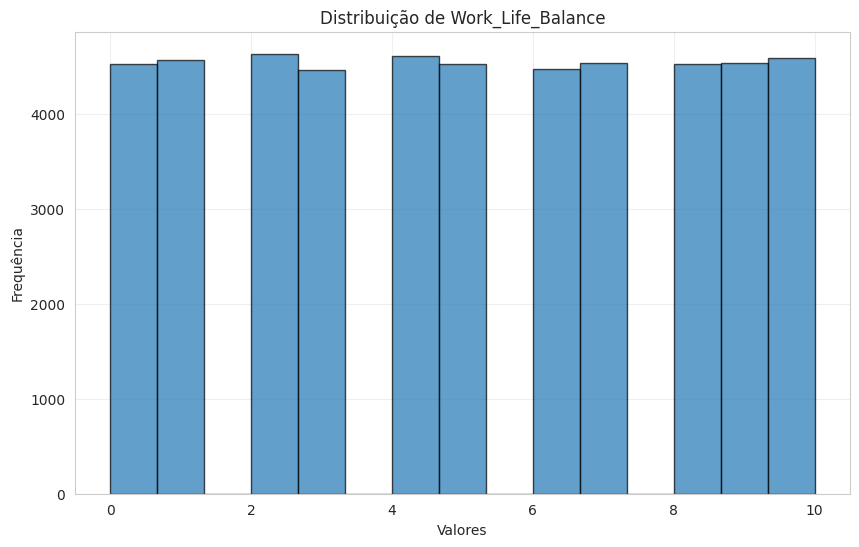

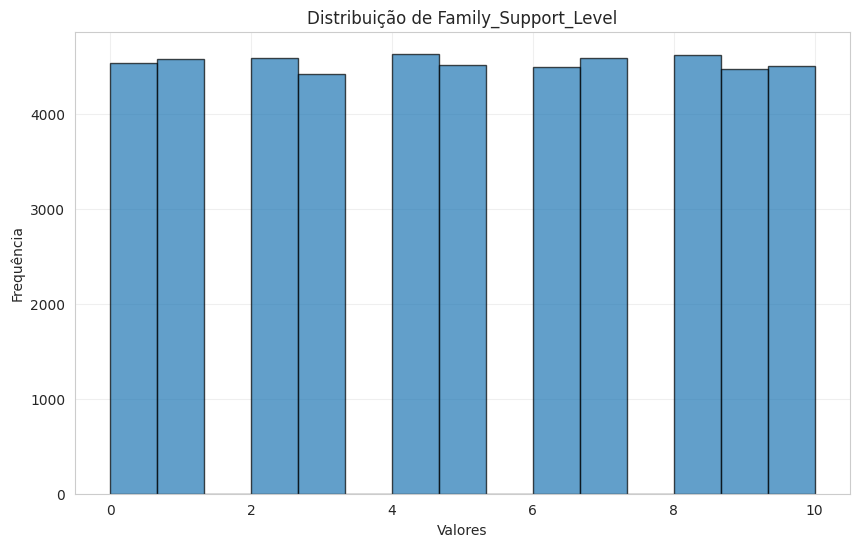

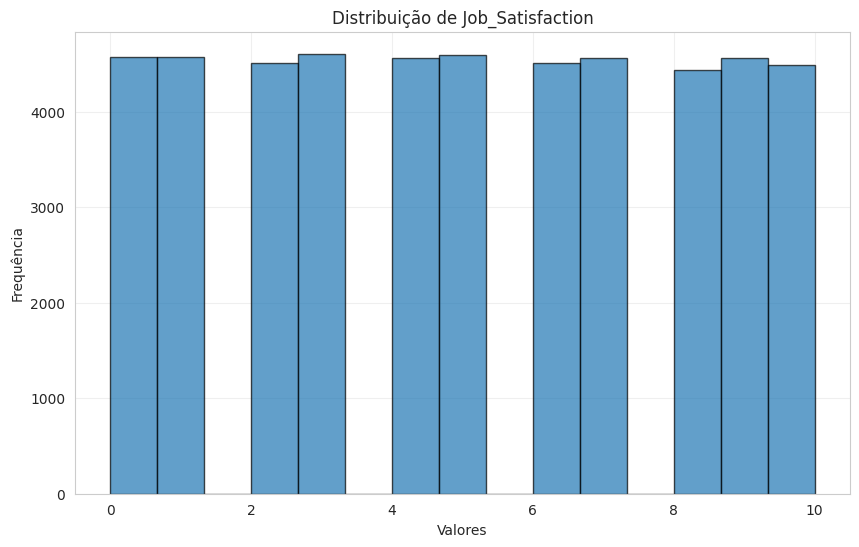

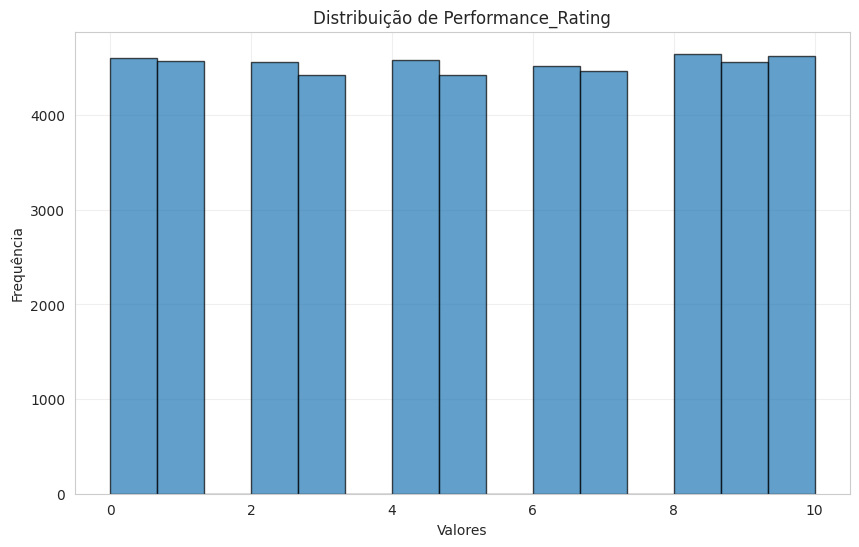

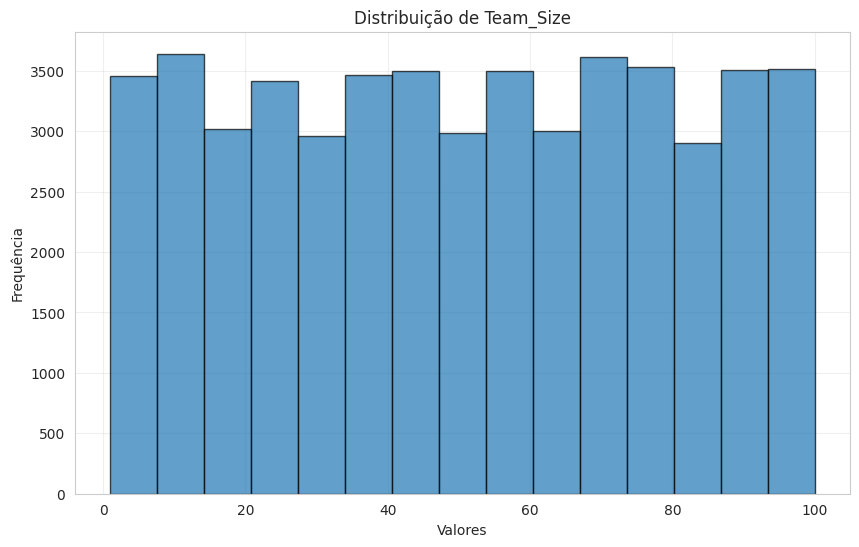


Estatísticas para ID:
Média: 25000.50
Mediana: 25000.50
Média Truncada (10%): 25000.50
Outliers identificados: []...

Estatísticas para Age:
Média: 41.52
Mediana: 41.00
Média Truncada (10%): 41.51
Outliers identificados: []...

Estatísticas para Experience_Years:
Média: 20.07
Mediana: 20.00
Média Truncada (10%): 20.08
Outliers identificados: []...

Estatísticas para Monthly_Salary_INR:
Média: 110129.93
Mediana: 110168.20
Média Truncada (10%): 110165.08
Outliers identificados: []...

Estatísticas para Working_Hours_per_Week:
Média: 62.54
Mediana: 62.00
Média Truncada (10%): 62.54
Outliers identificados: []...

Estatísticas para Commute_Time_Hours:
Média: 1.50
Mediana: 1.50
Média Truncada (10%): 1.50
Outliers identificados: []...

Estatísticas para Stress_Level:
Média: 5.00
Mediana: 5.00
Média Truncada (10%): 5.00
Outliers identificados: []...

Estatísticas para Sleep_Hours:
Média: 6.50
Mediana: 6.50
Média Truncada (10%): 6.50
Outliers identificados: []...

Estatísticas para Physical_Ac

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def calcular_media(valores):
    return sum(valores) / len(valores)

def calcular_media_ponderada(valores, pesos):
    return sum(v * p for v, p in zip(valores, pesos)) / sum(pesos)

def calcular_media_truncada(valores, proporcao_remover):
    valores_ordenados = sorted(valores)
    n_remover = int(len(valores) * proporcao_remover)
    valores_truncados = valores_ordenados[n_remover:len(valores) - n_remover]
    return sum(valores_truncados) / len(valores_truncados)

def calcular_mediana(valores):
    valores_ordenados = sorted(valores)
    n = len(valores)
    meio = n // 2
    if n % 2 == 0:
        return (valores_ordenados[meio - 1] + valores_ordenados[meio]) / 2
    else:
        return valores_ordenados[meio]

def encontrar_outliers(valores, ajuste):
    valores_ordenados = sorted(valores)
    q1 = calcular_mediana(valores_ordenados[:len(valores_ordenados) // 2])
    q3 = calcular_mediana(valores_ordenados[len(valores_ordenados) // 2:])
    iqr = q3 - q1
    limite_inferior = q1 - ajuste * iqr
    limite_superior = q3 + ajuste * iqr
    outliers = [v for v in valores if v < limite_inferior or v > limite_superior]
    return outliers

def calcular_variancia(dados, media):
    return sum((x - media) ** 2 for x in dados) / len(dados)

def calcular_desvio_padrao(variancia):
    return variancia ** 0.5

def calcular_correlacao(x, y):
    media_x = calcular_media(x)
    media_y = calcular_media(y)

    variancia_x = calcular_variancia(x, media_x)
    variancia_y = calcular_variancia(y, media_y)

    desvio_x = calcular_desvio_padrao(variancia_x)
    desvio_y = calcular_desvio_padrao(variancia_y)

    covariancia = sum((x[i] - media_x) * (y[i] - media_y) for i in range(len(x))) / len(x)

    return covariancia / (desvio_x * desvio_y)

def calcular_matriz_correlacao(df):
    atributos = df.columns
    matriz_correlacao = pd.DataFrame(index=atributos, columns=atributos)
    for i in range(len(atributos)):
        for j in range(i, len(atributos)):
            atributo_x = atributos[i]
            atributo_y = atributos[j]

            correlacao = calcular_correlacao(df[atributo_x], df[atributo_y])

            matriz_correlacao.loc[atributo_x, atributo_y] = correlacao
            matriz_correlacao.loc[atributo_y, atributo_x] = correlacao

    return matriz_correlacao

def plot_matriz_correlacao(matriz_correlacao):
    plt.figure(figsize=(10, 8))
    sns.heatmap(matriz_correlacao.astype(float), annot=True, cmap='coolwarm',
                vmin=-1, vmax=1, center=0)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.title('Matriz de Correlação')
    plt.tight_layout()
    plt.show()

def plot_matriz_dispersao(df):
    sns.set_style("whitegrid")
    g = sns.pairplot(df, diag_kind="hist")
    plt.suptitle('Gráficos de Dispersão entre Atributos', y=1.02)
    plt.show()

def plot_hist(dados, bins=5, titulo='Histograma'):
    plt.figure(figsize=(10, 6))
    plt.hist(dados, bins=bins, edgecolor='black', alpha=0.7)
    plt.title(titulo)
    plt.xlabel('Valores')
    plt.ylabel('Frequência')
    plt.grid(True, alpha=0.3)
    plt.show()

if __name__ == "__main__":
    # Carregar o dataset
    df = pd.read_csv('corporate_stress_dataset.csv')

    # Selecionar apenas colunas numéricas
    df_numerico = df.select_dtypes(include=[np.number])

    # 1. Calcular e plotar matriz de correlação
    matriz_corr = calcular_matriz_correlacao(df_numerico)
    print("\nMatriz de Correlação:")
    print(matriz_corr)
    plot_matriz_correlacao(matriz_corr)

    # 2. Plotar matriz de dispersão
    plot_matriz_dispersao(df_numerico)

    # 3. Plotar histogramas para cada variável numérica
    for coluna in df_numerico.columns:
        plot_hist(df_numerico[coluna], bins=15, titulo=f'Distribuição de {coluna}')

    # 4. Demonstrar cálculos estatísticos para cada coluna numérica
    for coluna in df_numerico.columns:
        print(f"\nEstatísticas para {coluna}:")
        dados = df_numerico[coluna].values
        print(f"Média: {calcular_media(dados):.2f}")
        print(f"Mediana: {calcular_mediana(dados):.2f}")
        print(f"Média Truncada (10%): {calcular_media_truncada(dados, 0.1):.2f}")

        # 5. Identificar outliers
        outliers = encontrar_outliers(dados, 1.5)
        print(f"Outliers identificados: {outliers[:5]}...")  # Mostra apenas os 5 primeiros outliers

In [ ]:
def calculate_statistics(column):
    """
    Calcula estatísticas descritivas para uma coluna numérica
    """
    if not pd.api.types.is_numeric_dtype(column):
        return {
            "Tipo": "Não numérico",
            "Análise": "Estatísticas não aplicáveis"
        }


    mean = column.mean()
    median = column.median()
    mode = column.mode().values

    weighted_mean = np.average(column, weights=range(len(column)))


    trimmed_mean = stats.trim_mean(column, 0.1)


    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = column[(column < lower_bound) | (column > upper_bound)]

    return {
        "Média": mean,
        "Mediana": median,
        "Moda": mode,
        "Média Ponderada": weighted_mean,
        "Média Truncada": trimmed_mean,
        "Outliers": list(outliers),
        "Qtd Outliers": len(outliers)
    }

resultados = {}

for coluna in df.select_dtypes(include=[np.number]).columns:
    resultados[coluna] = calculate_statistics(df[coluna])


for coluna, stats in resultados.items():
    print(f"\nEstatísticas para {coluna}:")
    for metrica, valor in stats.items():
        print(f"{metrica}: {valor}")


Estatísticas para ID:
Média: 25000.5
Mediana: 25000.5
Moda: [    1     2     3 ... 49998 49999 50000]
Média Ponderada: 33334.0
Média Truncada: 25000.5
Outliers: []
Qtd Outliers: 0

Estatísticas para Age:
Média: 41.5186
Mediana: 41.0
Moda: [34]
Média Ponderada: 41.53591111102222
Média Truncada: 41.5093
Outliers: []
Qtd Outliers: 0

Estatísticas para Experience_Years:
Média: 20.07158
Mediana: 20.0
Moda: [27]
Média Ponderada: 20.071895746714933
Média Truncada: 20.080625
Outliers: []
Qtd Outliers: 0

Estatísticas para Monthly_Salary_INR:
Média: 110129.926165
Mediana: 110168.20499999999
Moda: [ 22978.74  25508.24  30329.9   35881.55  36600.52  37537.41  37645.04
  40340.44  43141.85  43760.77  46784.18  49374.4   52111.24  54674.8
  59168.86  60867.35  61442.83  61984.22  63079.72  63200.24  64326.02
  75408.35  76048.39  79832.08  83063.32  86325.65  87349.53  90639.76
  93358.16  94969.33  98367.33 100625.05 101223.03 105549.42 106657.38
 106745.54 108597.66 110407.08 112782.56 116589.39

## **Análise Exploratória e Pré-processamento de Dados**

In [ ]:
import pandas as pd

df = pd.read_csv('/content/corporate_stress_dataset.csv',index_col=0)
df.head(5)

,Age,Gender,Marital_Status,Job_Role,Experience_Years,Monthly_Salary_INR,Working_Hours_per_Week,Commute_Time_Hours,Remote_Work,Stress_Level,...,Work_Life_Balance,Family_Support_Level,Job_Satisfaction,Performance_Rating,Team_Size,Training_Opportunities,Gender_Bias_Experienced,Discrimination_Experienced,Burnout_Symptoms,Location
ID,,,,,,,,,,,,,,,,,,,,,
1,56,Non-Binary,Widowed,Developer,5,102703.08,44,1.72,True,0,...,9,2,5,10,38,False,True,True,No,Tier-3
2,46,Female,Single,Analyst,20,165583.91,54,0.62,True,7,...,9,1,10,9,72,True,True,True,No,Tier-3
3,32,Female,Single,Developer,10,38005.39,81,1.22,False,7,...,6,1,1,1,67,False,False,False,Yes,Metro
4,60,Female,Divorced,Analyst,26,51127.36,79,2.03,False,6,...,8,10,5,10,98,True,True,False,Yes,Metro
5,25,Male,Married,Sales,29,174597.45,63,1.45,True,8,...,3,1,9,2,85,True,False,False,No,Tier-1


In [ ]:
#O tamanho de linha e coluna do dataset
df.shape

(50000, 29)

In [ ]:
# As informações da base (Tipo da coluna, linha não nulas, ...)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50000 entries, 1 to 50000
Data columns (total 29 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Age                               50000 non-null  int64  
 1   Gender                            50000 non-null  object 
 2   Marital_Status                    50000 non-null  object 
 3   Job_Role                          50000 non-null  object 
 4   Experience_Years                  50000 non-null  int64  
 5   Monthly_Salary_INR                50000 non-null  float64
 6   Working_Hours_per_Week            50000 non-null  int64  
 7   Commute_Time_Hours                50000 non-null  float64
 8   Remote_Work                       50000 non-null  bool   
 9   Stress_Level                      50000 non-null  int64  
 10  Health_Issues                     37459 non-null  object 
 11  Company_Size                      50000 non-null  object 
 12  Departmen

In [ ]:
#O resumo estatístico
df.describe()

,Age,Experience_Years,Monthly_Salary_INR,Working_Hours_per_Week,Commute_Time_Hours,Stress_Level,Sleep_Hours,Physical_Activity_Hours_per_Week,Manager_Support_Level,Work_Pressure_Level,Annual_Leaves_Taken,Work_Life_Balance,Family_Support_Level,Job_Satisfaction,Performance_Rating,Team_Size
count,50000.000000,50000.000000,50000.000000,50000.00000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.00000,50000.000000,50000.00000
mean,41.518600,20.071580,110129.926165,62.53824,1.500454,5.004680,6.498888,5.011624,5.004120,5.004420,14.992300,4.996920,4.993940,4.98412,5.006940,50.49730
std,13.833279,11.835681,52069.676542,16.16981,0.867738,3.154745,1.437200,2.885061,3.160314,3.159614,8.943398,3.165728,3.160674,3.16003,3.176535,28.89238
min,18.000000,0.000000,20001.960000,35.00000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.00000
25%,30.000000,10.000000,64875.487500,49.00000,0.740000,2.000000,5.300000,2.500000,2.000000,2.000000,7.000000,2.000000,2.000000,2.00000,2.000000,25.00000
50%,41.000000,20.000000,110168.205000,62.00000,1.500000,5.000000,6.500000,5.000000,5.000000,5.000000,15.000000,5.000000,5.000000,5.00000,5.000000,51.00000
75%,54.000000,30.000000,155322.665000,77.00000,2.250000,8.000000,7.700000,7.500000,8.000000,8.000000,23.000000,8.000000,8.000000,8.00000,8.000000,75.00000
max,65.000000,40.000000,199992.800000,90.00000,3.000000,10.000000,9.000000,10.000000,10.000000,10.000000,30.000000,10.000000,10.000000,10.00000,10.000000,100.00000


In [ ]:
# Cardinalidade do dataset
df.nunique()

,0
Age,48
Gender,3
Marital_Status,4
Job_Role,6
Experience_Years,41
Monthly_Salary_INR,49927
Working_Hours_per_Week,56
Commute_Time_Hours,301
Remote_Work,2
Stress_Level,11


In [ ]:
# Visualizar valores vazios
df.isnull().sum()

,0
Age,0
Gender,0
Marital_Status,0
Job_Role,0
Experience_Years,0
Monthly_Salary_INR,0
Working_Hours_per_Week,0
Commute_Time_Hours,0
Remote_Work,0
Stress_Level,0


In [ ]:
#Verificando os valores vazios
df[df.Health_Issues.isnull()]


,Age,Gender,Marital_Status,Job_Role,Experience_Years,Monthly_Salary_INR,Working_Hours_per_Week,Commute_Time_Hours,Remote_Work,Stress_Level,...,Work_Life_Balance,Family_Support_Level,Job_Satisfaction,Performance_Rating,Team_Size,Training_Opportunities,Gender_Bias_Experienced,Discrimination_Experienced,Burnout_Symptoms,Location
ID,,,,,,,,,,,,,,,,,,,,,
1,56,Non-Binary,Widowed,Developer,5,102703.08,44,1.72,True,0,...,9,2,5,10,38,False,True,True,No,Tier-3
2,46,Female,Single,Analyst,20,165583.91,54,0.62,True,7,...,9,1,10,9,72,True,True,True,No,Tier-3
11,28,Female,Widowed,Sales,32,117789.06,75,0.82,False,3,...,6,6,2,7,3,False,True,False,Yes,Tier-2
14,57,Female,Married,HR,35,71621.93,68,2.57,True,0,...,8,4,0,10,60,True,True,True,Yes,Tier-3
17,39,Non-Binary,Single,HR,14,173926.86,62,2.69,False,9,...,4,3,1,9,69,False,True,False,Yes,Metro
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49957,28,Non-Binary,Married,Analyst,1,68541.29,38,1.06,False,3,...,8,7,3,7,32,False,True,False,No,Tier-1
49960,21,Female,Widowed,Analyst,3,127584.91,41,0.54,True,4,...,4,8,9,2,54,True,False,True,Occasional,Tier-3
49984,42,Female,Widowed,Support,32,64835.36,78,1.94,True,0,...,7,6,2,2,1,False,True,False,No,Metro


In [ ]:
#Adicionando valor nos valores vazios
df.loc[df.Health_Issues.isnull(), 'Health_Issues'] = 'Desconhecido'

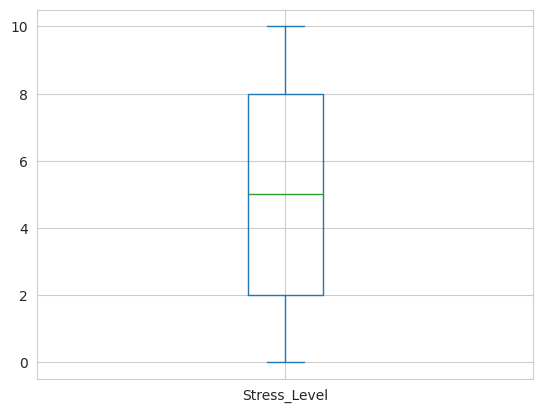

In [ ]:
# Visualizar graficamente Health_Issues
df.Stress_Level.plot.box();

<ipython-input-86-a112ed97da9a>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Gender', y='Stress_Level', data=df, palette='coolwarm')


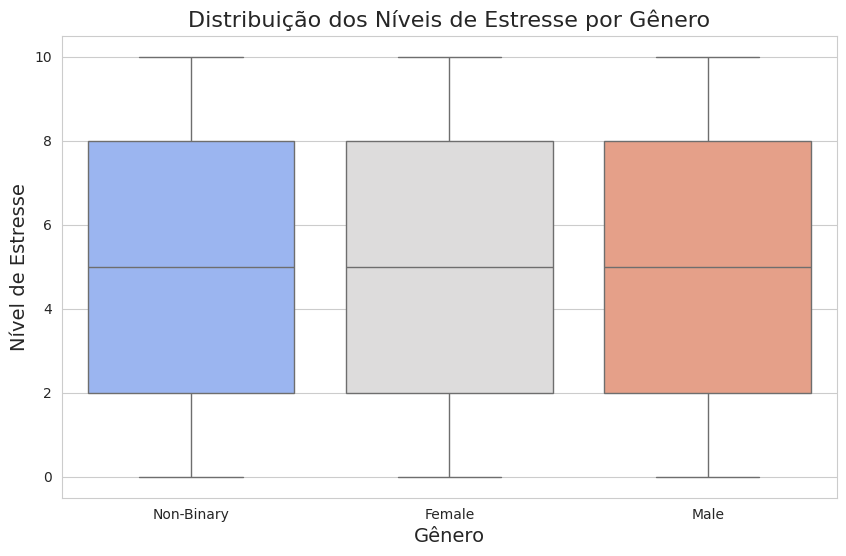

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Fazer comparação com Stress_Level pelo Gender usando bloxplot
# Substitua 'Gender' e 'Stress_Level' pelos nomes reais das colunas do seu dataset, se forem diferentes
plt.figure(figsize=(10, 6))

sns.boxplot(x='Gender', y='Stress_Level', data=df, palette='coolwarm')

# Adicionando título e rótulos
plt.title('Distribuição dos Níveis de Estresse por Gênero', fontsize=16)
plt.xlabel('Gênero', fontsize=14)
plt.ylabel('Nível de Estresse', fontsize=14)

# Exibindo o gráfico
plt.show()


## **Modelagem e métricas de avaliação**

In [ ]:
# Importar bibliotecas necessárias
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('/content/corporate_stress_dataset.csv',index_col=0)

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Normalização
scaler = MinMaxScaler()
df['coluna_normalizada'] = scaler.fit_transform(df[['Stress_Level']])

# Padronização
scaler = StandardScaler()
df['coluna_padronizada'] = scaler.fit_transform(df[['Stress_Level']])

Desempenho da Árvore de Decisão:
              precision    recall  f1-score   support

           0       0.10      0.10      0.10      1332
           1       0.08      0.09      0.09      1366
           2       0.09      0.09      0.09      1379
           3       0.09      0.09      0.09      1360
           4       0.08      0.08      0.08      1372
           5       0.09      0.09      0.09      1391
           6       0.09      0.09      0.09      1350
           7       0.11      0.11      0.11      1360
           8       0.10      0.10      0.10      1347
           9       0.10      0.10      0.10      1398
          10       0.09      0.09      0.09      1345

    accuracy                           0.09     15000
   macro avg       0.09      0.09      0.09     15000
weighted avg       0.09      0.09      0.09     15000

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


875/875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.0901 - loss: 1947.3779 - val_accuracy: 0.0921 - val_loss: 360.2752
Epoch 2/20
875/875 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0884 - loss: 316.5486 - val_accuracy: 0.0867 - val_loss: 199.2648
Epoch 3/20
875/875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.0912 - loss: 201.5073 - val_accuracy: 0.0917 - val_loss: 171.8905
Epoch 4/20
875/875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.0917 - loss: 202.3929 - val_accuracy: 0.0917 - val_loss: 141.7639
Epoch 5/20
875/875 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.0941 - loss: 176.7749 - val_accuracy: 0.0923 - val_loss: 139.6209
Epoch 6/20
875/875 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0932 - loss: 147.9986 - val_accuracy: 0.0940 - val_loss: 121.3163
Epoch 7/20
875/875 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0908 - loss: 96.8586 - val_accuracy: 0.0920 - val_loss: 2.7749
Epoch 8/20
875/875 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0886 - loss: 2.6152 - v

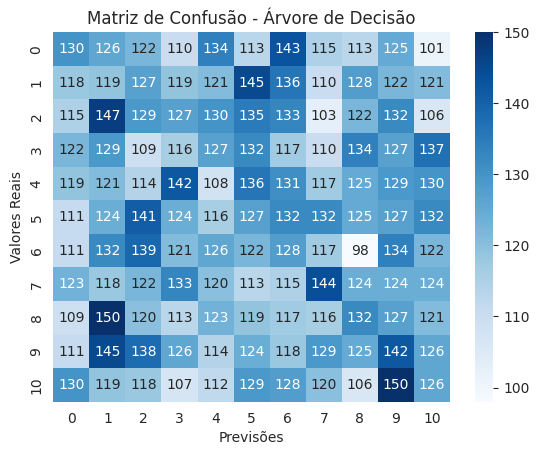

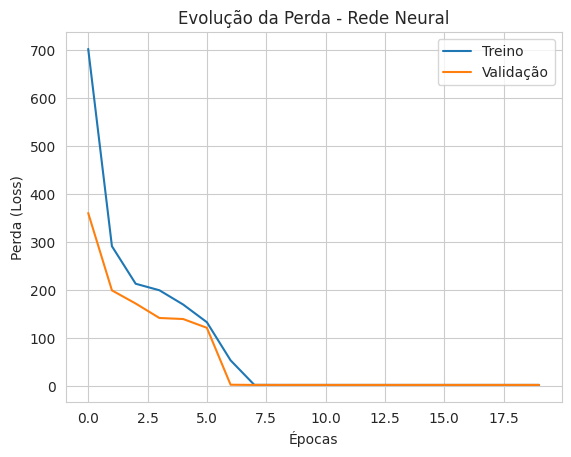

In [ ]:
# 1. Carregar o dataset
# Substitua 'seu_dataset.csv' pelo caminho do seu arquivo
df = pd.read_csv('/content/corporate_stress_dataset.csv')

# 2. Pré-processamento de Dados
# Exemplo de remoção de duplicados
df = df.drop_duplicates()

# Tratamento de valores ausentes (substituição pela mediana)
df.fillna(df.median(numeric_only=True), inplace=True)

# Codificação de variáveis categóricas (one-hot encoding)
df = pd.get_dummies(df, drop_first=True)

# Divisão de características (X) e variável-alvo (y)
X = df.drop('Stress_Level', axis=1)  # Substitua 'target' pela sua variável-alvo
y = df['Stress_Level']

# 3. Divisão em treino e teste (70%/30%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# 4. Treinamento de uma Árvore de Decisão
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)
y_pred_dt = dt_model.predict(X_test)

# Avaliação da Árvore de Decisão
print("Desempenho da Árvore de Decisão:")
print(classification_report(y_test, y_pred_dt))

# 5. Treinamento de uma Rede Neural
# Codificar as classes-alvo para uma rede neural
y_train_nn = to_categorical(y_train)
y_test_nn = to_categorical(y_test)

# Criar o modelo de rede neural
nn_model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu'),
    Dense(y_train_nn.shape[1], activation='softmax')
])

# Compilar o modelo
nn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
history = nn_model.fit(X_train, y_train_nn, epochs=20, batch_size=32, validation_split=0.2, verbose=1)

# Avaliar o modelo
nn_loss, nn_accuracy = nn_model.evaluate(X_test, y_test_nn, verbose=0)
print(f"Desempenho da Rede Neural - Acurácia: {nn_accuracy:.4f}")

# 6. Visualização dos resultados
# Matriz de confusão para a Árvore de Decisão
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(y_test, y_pred_dt)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.title("Matriz de Confusão - Árvore de Decisão")
plt.xlabel("Previsões")
plt.ylabel("Valores Reais")
plt.show()

# Gráfico de evolução da perda (loss) na Rede Neural
plt.plot(history.history['loss'], label='Treino')
plt.plot(history.history['val_loss'], label='Validação')
plt.title("Evolução da Perda - Rede Neural")
plt.xlabel("Épocas")
plt.ylabel("Perda (Loss)")
plt.legend()
plt.show()

# 7. Exportação dos resultados
# Salvar métricas da árvore de decisão em um arquivo
metrics = {
    "Accuracy": accuracy_score(y_test, y_pred_dt),
    "Precision": precision_score(y_test, y_pred_dt, average='weighted'),
    "Recall": recall_score(y_test, y_pred_dt, average='weighted'),
    "F1-Score": f1_score(y_test, y_pred_dt, average='weighted')
}
metrics_df = pd.DataFrame([metrics])
metrics_df.to_csv('resultados_decision_tree.csv', index=False)

# Salvar o modelo da rede neural
nn_model.save('modelo_rede_neural.h5')


## **Resultados comparativos**

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import datasets
from scipy import stats
from scipy.stats import skew, kurtosis
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

In [ ]:
df = pd.read_csv('/content/corporate_stress_dataset.csv')

In [ ]:
 Criando faixas de idade
bins = [0, 18, 35, 60, 100]
labels = ['Jovem', 'Adulto', 'Meia-Idade', 'Idoso']
df['faixa_etária'] = pd.cut(df['Age'], bins=bins, labels=labels)
df


,ID,Age,Gender,Marital_Status,Job_Role,Experience_Years,Monthly_Salary_INR,Working_Hours_per_Week,Commute_Time_Hours,Remote_Work,...,Family_Support_Level,Job_Satisfaction,Performance_Rating,Team_Size,Training_Opportunities,Gender_Bias_Experienced,Discrimination_Experienced,Burnout_Symptoms,Location,faixa_etária
0,1,56,Non-Binary,Widowed,Developer,5,102703.08,44,1.72,True,...,2,5,10,38,False,True,True,No,Tier-3,Meia-Idade
1,2,46,Female,Single,Analyst,20,165583.91,54,0.62,True,...,1,10,9,72,True,True,True,No,Tier-3,Meia-Idade
2,3,32,Female,Single,Developer,10,38005.39,81,1.22,False,...,1,1,1,67,False,False,False,Yes,Metro,Adulto
3,4,60,Female,Divorced,Analyst,26,51127.36,79,2.03,False,...,10,5,10,98,True,True,False,Yes,Metro,Meia-Idade
4,5,25,Male,Married,Sales,29,174597.45,63,1.45,True,...,1,9,2,85,True,False,False,No,Tier-1,Adulto
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,49996,43,Female,Widowed,HR,8,34594.10,58,1.66,False,...,8,7,3,69,True,True,False,No,Tier-3,Meia-Idade
49996,49997,45,Male,Single,Analyst,31,117925.92,42,1.58,False,...,3,0,4,60,True,True,True,Occasional,Tier-2,Meia-Idade
49997,49998,43,Female,Divorced,Manager,7,109814.51,49,1.49,True,...,0,10,6,56,False,True,False,No,Metro,Meia-Idade
49998,49999,62,Male,Married,HR,9,74918.42,72,2.64,False,...,4,2,8,50,True,False,True,Yes,Tier-2,Idoso


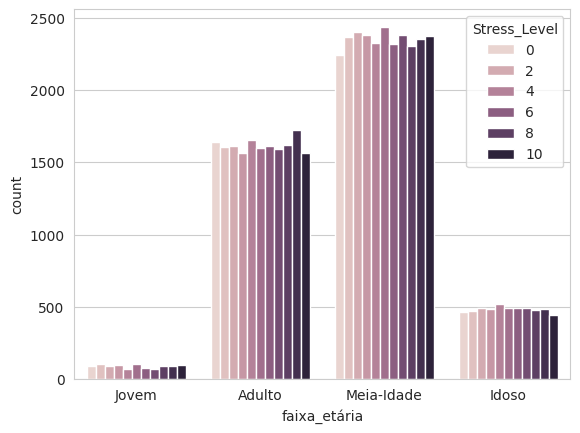

In [ ]:
#Visualizando a Variável Stress_Level x Burnout_Symptoms

sns.countplot(data = df, x= "faixa_etária", hue = "Stress_Level")

plt.show()

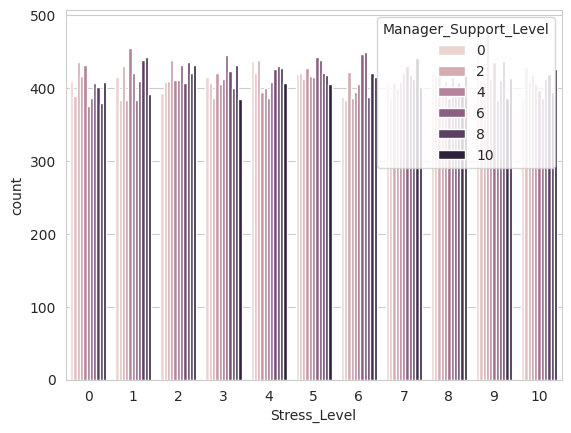

In [ ]:
# Visualizando a Variável Manager_Support_Level x Stress_Level

sns.countplot(data = df, x = "Stress_Level", hue = "Manager_Support_Level")
plt.show()

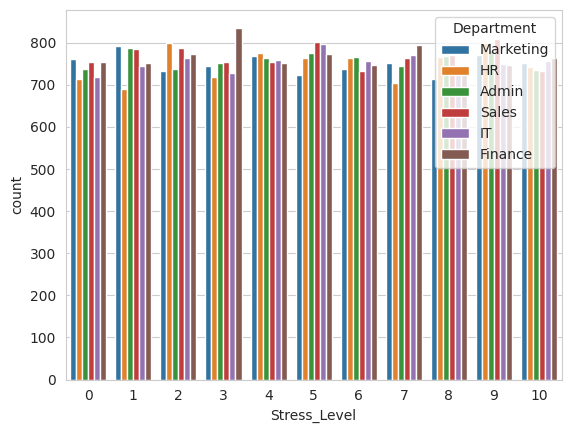

In [ ]:
 #Visualizando a Variável Gender x Department

sns.countplot(data = df, x = "Stress_Level", hue = "Department")
plt.show()